In [1]:
# !pip install tensorflow
# !pip install tensorflow_datasets
# !pip install tensorflow_hub
# !pip install keras_cv
# !pip install keras-cv tensorflow --upgrade
# !apt-get update && apt-get install -y python3-opencv
# !pip install opencv-python
# !pip install opencv-python opencv-python-headless
# !pip install pycocotools
# !pip install --upgrade -q git+https://github.com/keras-team/keras-cv

# !pip uninstall keras-cv -y
# !pip install --upgrade -q git+https://github.com/keras-team/keras-cv

In [2]:
import sys
print(sys.version)

3.11.0rc1 (main, Aug 12 2022, 10:02:14) [GCC 11.2.0]


In [3]:
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow import keras
from tensorflow.keras import optimizers
import keras_cv
from keras_cv import bounding_box
from keras_cv import visualization
from keras.preprocessing import image
import cv2
import numpy as np
import os
import resource
import tqdm

import my_dataset.my_dataset_dataset_builder

%load_ext tensorboard
%load_ext autoreload
%autoreload 2

2023-11-09 01:59:06.678413: I tensorflow/core/util/port.cc:111] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-11-09 01:59:06.717155: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-09 01:59:06.717186: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-09 01:59:06.717206: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-11-09 01:59:06.724937: I tensorflow/core/platform/cpu_feature_g

Using TensorFlow backend


## Data conversion and visualization functions

In [4]:
BATCH_SIZE = 4

def visualize_dataset(inputs, value_range, rows, cols, bounding_box_format):
    inputs = next(iter(inputs.take(1)))
    images, bounding_boxes = inputs["images"], inputs["bounding_boxes"]
    visualization.plot_bounding_box_gallery(
        images,
        value_range=value_range,
        rows=rows,
        cols=cols,
        y_true=bounding_boxes,
        scale=5,
        font_scale=0.7,
        bounding_box_format=bounding_box_format,
        class_mapping=class_mapping,
    )


def unpackage_raw_tfds_inputs(inputs, bounding_box_format):
    image = inputs["image"]
    boxes = keras_cv.bounding_box.convert_format(
        inputs["bounding_boxes"]["boxes"],
        images=image,
        source="rel_yxyx",
        target=bounding_box_format,
    )
    bounding_boxes = {
        "boxes": tf.cast(boxes, dtype=tf.float32),
        "classes": tf.cast(inputs["bounding_boxes"]["classes"], dtype=tf.float32),
    }
    return {"images": tf.cast(image, tf.float32), "bounding_boxes": bounding_boxes}


def load_baggage_dataset(split, dataset, bounding_box_format):
    (train_ds, val_ds), ds_info = tfds.load(dataset, split=split, with_info=True, shuffle_files=True)
    
    train_ds = train_ds.map(
        lambda x: unpackage_raw_tfds_inputs(x, bounding_box_format=bounding_box_format),
        num_parallel_calls=tf.data.AUTOTUNE,
    )
    val_ds = val_ds.map(
        lambda x: unpackage_raw_tfds_inputs(x, bounding_box_format=bounding_box_format),
        num_parallel_calls=tf.data.AUTOTUNE,
    )
    
    return (train_ds, val_ds), ds_info

class_ids = ['handbag', 'suitcase', 'stroller', 'backpack', 'golf_club', 'duffel_bag']
class_mapping = dict(zip(range(len(class_ids)), class_ids))

## Loading Custom Dataset

In [5]:
(train_ds, val_ds), ds_info = load_baggage_dataset(
    split=['train[:80%]', 'train[80%:]'], dataset='my_dataset_builder', bounding_box_format="xywh"
)

train_ds = train_ds.shuffle(BATCH_SIZE * 4)

2023-11-09 01:59:11.181509: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1886] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 14773 MB memory:  -> device: 0, name: Quadro RTX 5000, pci bus id: 0000:3d:00.0, compute capability: 7.5
2023-11-09 01:59:11.182619: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1886] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 14773 MB memory:  -> device: 1, name: Quadro RTX 5000, pci bus id: 0000:3f:00.0, compute capability: 7.5


In [6]:
train_ds = train_ds.ragged_batch(BATCH_SIZE, drop_remainder=True)
val_ds = val_ds.ragged_batch(BATCH_SIZE, drop_remainder=True)
print('Batches in train: ', len(train_ds))
print('Batches in val: ', len(val_ds))

Batches in train:  1030
Batches in val:  257


## Visualizing training data and validation data

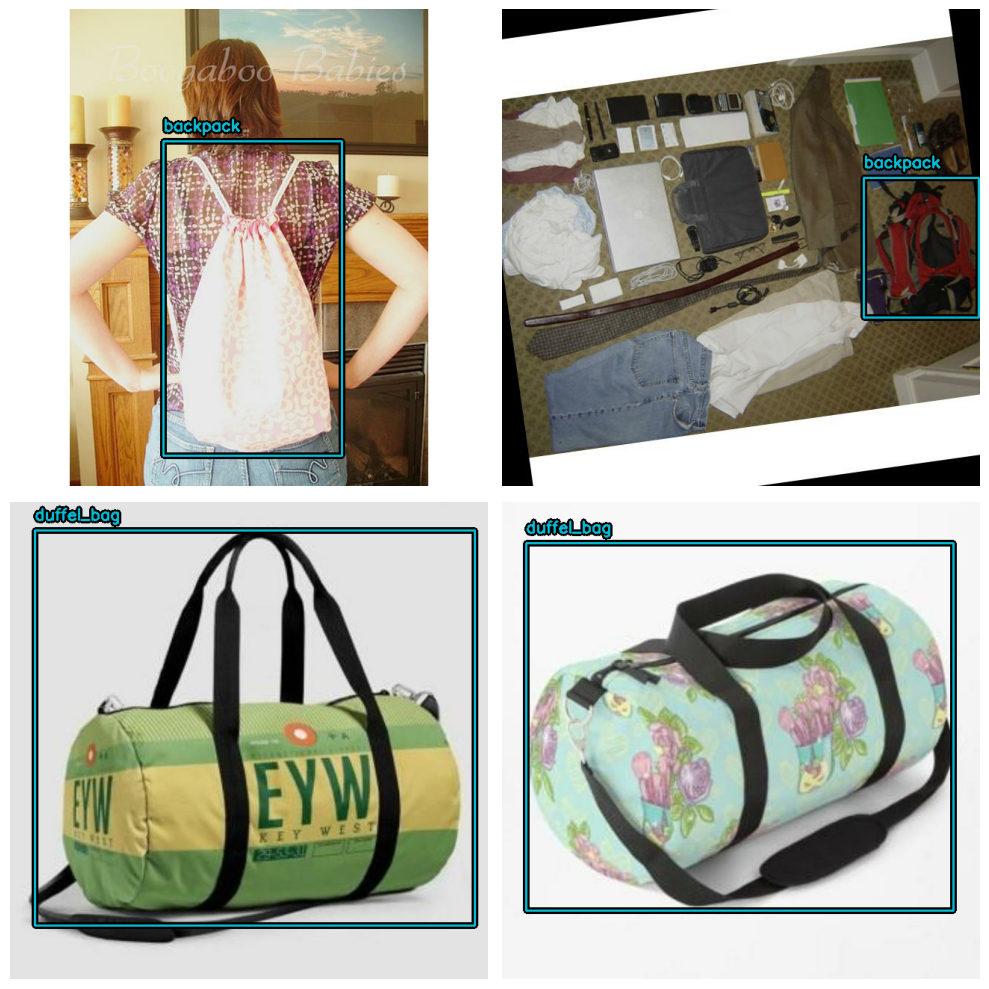

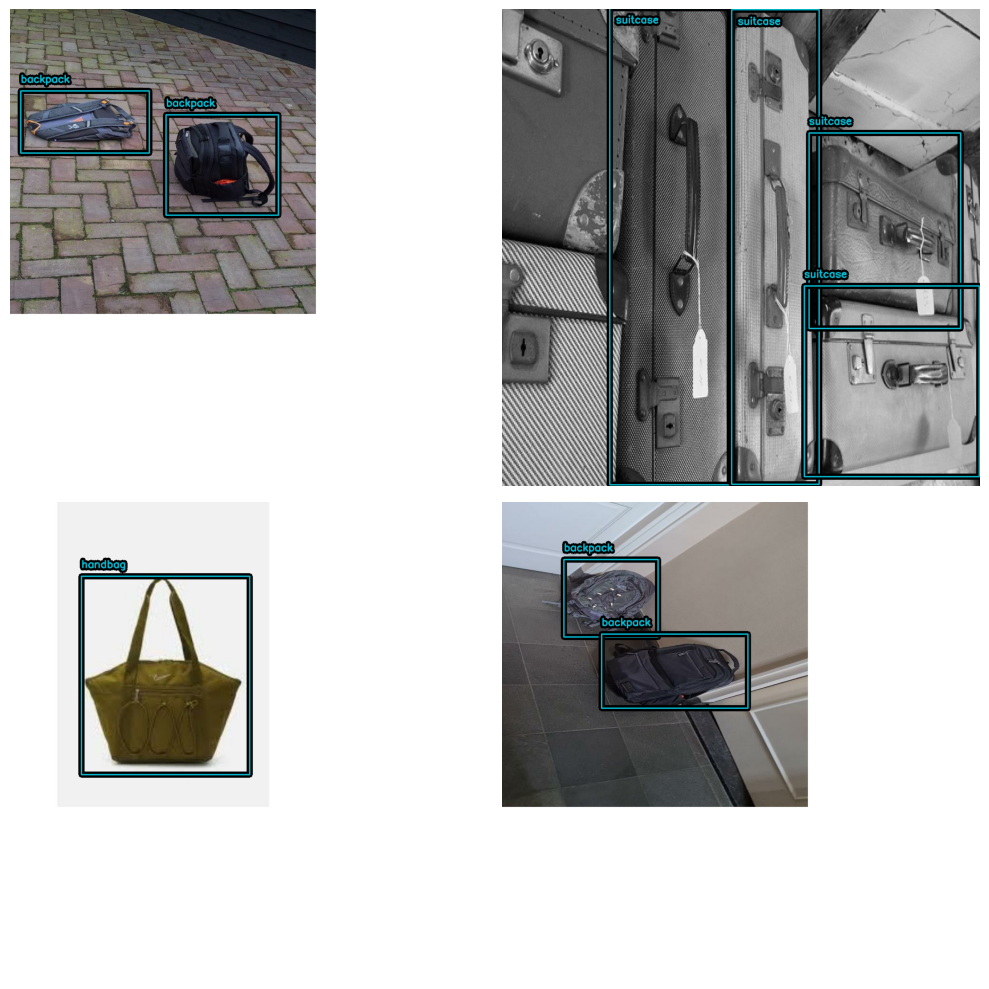

In [7]:
visualize_dataset(
    train_ds, bounding_box_format="xywh", value_range=(0, 255), rows=2, cols=2
)
visualize_dataset(
    val_ds, bounding_box_format="xywh", value_range=(0, 255), rows=2, cols=2,
)

2023-11-09 01:59:21.600816: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 01:59:21.601310: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB


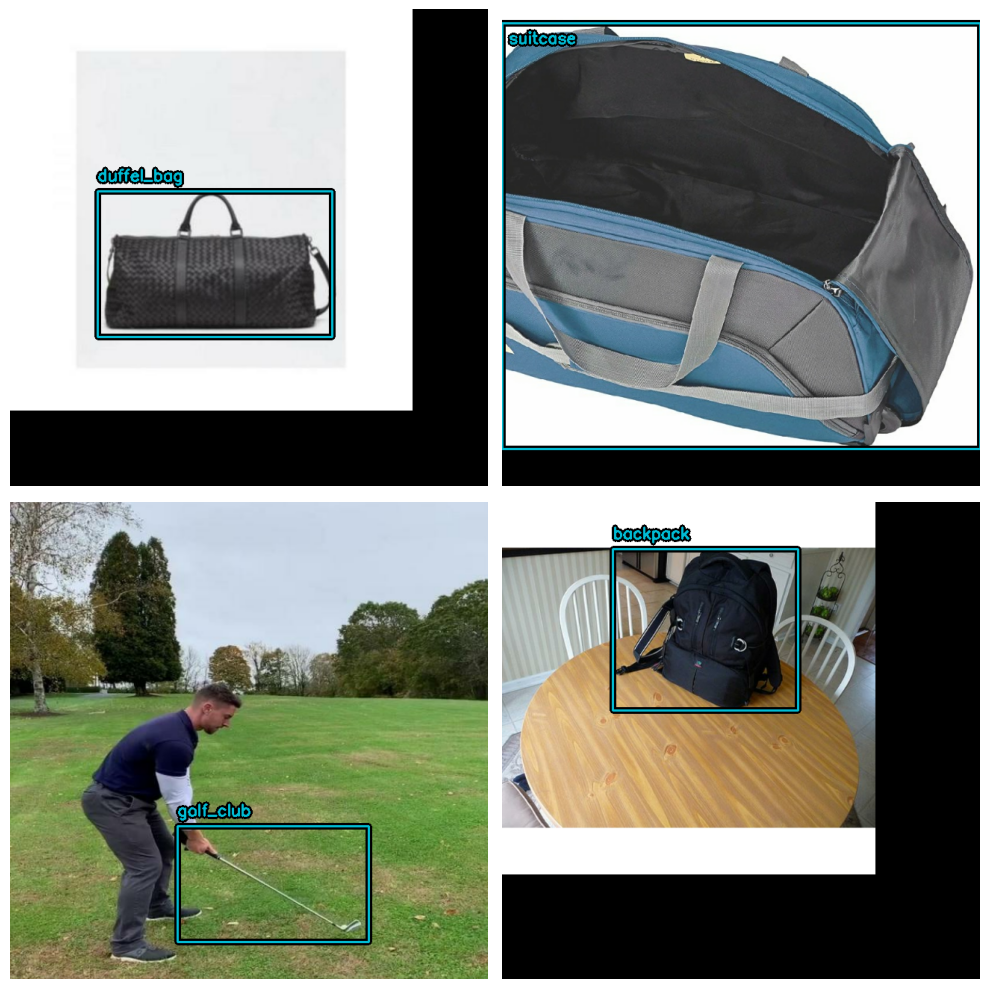

In [8]:
augmenter = keras.Sequential(
    layers=[
        keras_cv.layers.RandomFlip(mode="horizontal", bounding_box_format="xywh"),
        keras_cv.layers.JitteredResize(
            target_size=(640, 640), scale_factor=(0.75, 1.3), bounding_box_format="xywh"
        ),
    ]
)

train_ds = train_ds.map(augmenter, num_parallel_calls=tf.data.AUTOTUNE)
visualize_dataset(
    train_ds, bounding_box_format="xywh", value_range=(0, 255), rows=2, cols=2
)

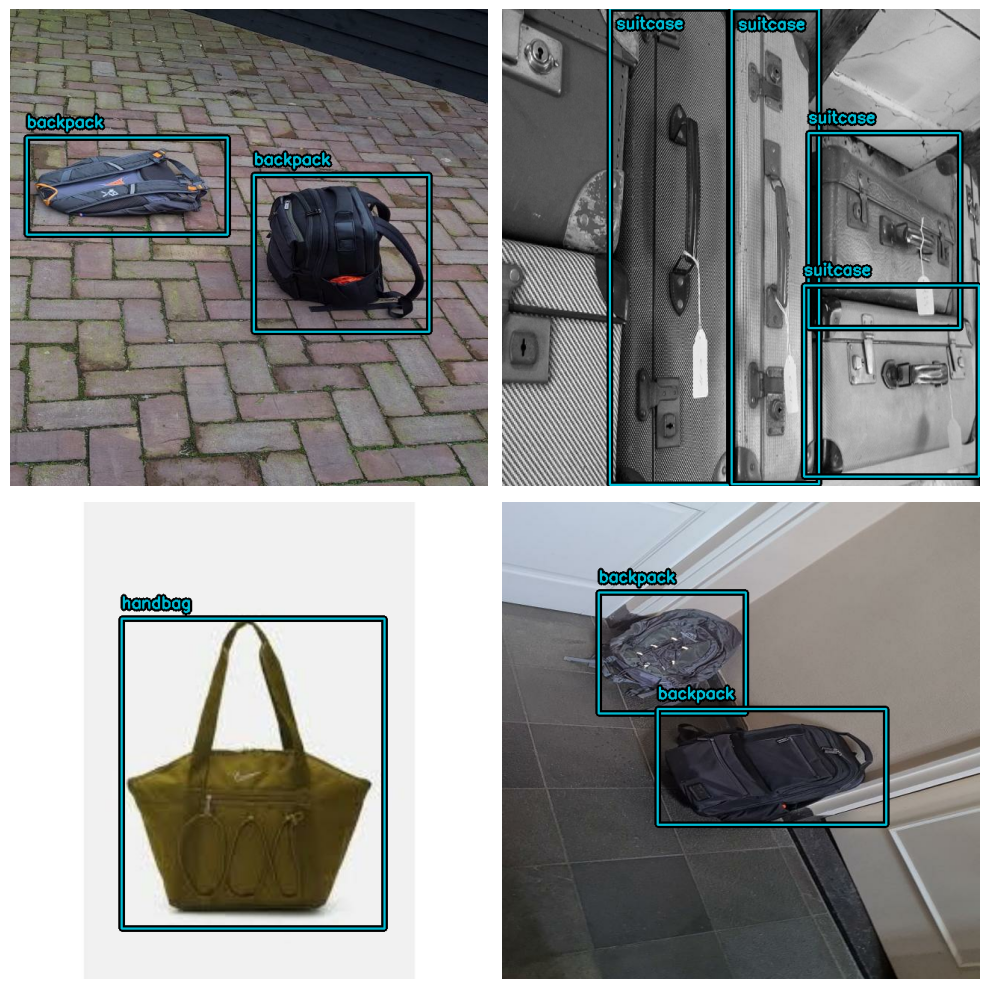

In [9]:
inference_resizing = keras_cv.layers.Resizing(
    640, 640, bounding_box_format="xywh", pad_to_aspect_ratio=True
)
val_ds = val_ds.map(inference_resizing, num_parallel_calls=tf.data.AUTOTUNE)

visualize_dataset(
    val_ds, bounding_box_format="xywh", value_range=(0, 255), rows=2, cols=2
)

In [10]:
def dict_to_tuple(inputs):
    return inputs["images"],bounding_box.to_dense(
        inputs["bounding_boxes"],max_boxes=32
    )


train_ds = train_ds.map(dict_to_tuple, num_parallel_calls=tf.data.AUTOTUNE)
val_ds = val_ds.map(dict_to_tuple, num_parallel_calls=tf.data.AUTOTUNE)

In [11]:
train_ds = train_ds.prefetch(tf.data.AUTOTUNE)
val_ds = val_ds.prefetch(tf.data.AUTOTUNE)

In [12]:
class EvaluateCOCOMetricsCallback(keras.callbacks.Callback):
    def __init__(self, data):
        super().__init__()
        self.data = data
        self.metrics = keras_cv.metrics.BoxCOCOMetrics(
            bounding_box_format="xywh",
            # passing 1e9 ensures we never evaluate until
            # `metrics.result(force=True)` is
            # called.
            evaluate_freq=1e9,
        )

    def on_epoch_end(self, epoch, logs):
        self.metrics.reset_state()
        for batch in tqdm.tqdm(self.data):
            images, y_true = batch[0], batch[1]
            y_pred = self.model.predict(images, verbose=0)
            self.metrics.update_state(y_true, y_pred)

        metrics = self.metrics.result(force=True)
        logs.update(metrics)
        return logs

## Creating and training model

In [13]:
base_lr = 0.005
# including a global_clipnorm is extremely important in object detection tasks
optimizer = tf.keras.optimizers.SGD(
    learning_rate=base_lr, momentum=0.9, global_clipnorm=10.0
)

In [14]:
model = keras_cv.models.RetinaNet.from_preset(
    "resnet50_imagenet",
    num_classes=len(class_mapping),
    # For more info on supported bounding box formats, visit
    # https://keras.io/api/keras_cv/bounding_box/
    bounding_box_format="xywh",
)

In [15]:
model.compile(
    classification_loss="focal",
    box_loss="smoothl1",
    optimizer=optimizer,
    # We will use our custom callback to evaluate COCO metrics
    metrics=None,
)

In [61]:
epochs_to_run = 9

model.fit(
    train_ds,
    validation_data=val_ds,
    # Run for 10-35~ epochs to achieve good scores.
    epochs=epochs_to_run,
    callbacks=[EvaluateCOCOMetricsCallback(val_ds)],
)

Epoch 1/9


2023-11-09 18:04:17.392198: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:04:17.392306: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB


   4/1030 [..............................] - ETA: 11:48 - loss: 0.1221 - box_loss: 0.0721 - classification_loss: 0.0500 - percent_boxes_matched_with_anchor: 0.9629

2023-11-09 18:04:19.721555: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


  30/1030 [..............................] - ETA: 5:09 - loss: 0.0768 - box_loss: 0.0482 - classification_loss: 0.0287 - percent_boxes_matched_with_anchor: 0.9633

2023-11-09 18:04:26.734541: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:04:26.734617: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB


1030/1030 [==============================] - ETA: 0s - loss: 0.0784 - box_loss: 0.0461 - classification_loss: 0.0323 - percent_boxes_matched_with_anchor: 0.9637

2023-11-09 18:09:04.682030: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:09:04.682168: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB
  2%|▍                          | 4/257 [00:01<01:12,  3.49it/s]2023-11-09 18:09:28.854349: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:09:28.854480: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB
100%|█████████████████████████| 257/257 [00:48<00:00,  5.28it/s]


1030/1030 [==============================] - 367s 349ms/step - loss: 0.0784 - box_loss: 0.0461 - classification_loss: 0.0323 - percent_boxes_matched_with_anchor: 0.9637 - val_loss: 0.3231 - val_box_loss: 0.1005 - val_classification_loss: 0.2226 - val_percent_boxes_matched_with_anchor: 0.9636 - MaP: 0.5989 - MaP@[IoU=50]: 0.8616 - MaP@[IoU=75]: 0.6871 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.2285 - MaP@[area=large]: 0.6166 - Recall@[max_detections=1]: 0.5956 - Recall@[max_detections=10]: 0.6568 - Recall@[max_detections=100]: 0.6574 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.2786 - Recall@[area=large]: 0.6753
Epoch 2/9


2023-11-09 18:10:17.677999: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:10:17.678077: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB


  10/1030 [..............................] - ETA: 4:48 - loss: 0.0751 - box_loss: 0.0423 - classification_loss: 0.0328 - percent_boxes_matched_with_anchor: 0.9633

2023-11-09 18:10:20.633038: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


  12/1030 [..............................] - ETA: 4:48 - loss: 0.0721 - box_loss: 0.0407 - classification_loss: 0.0313 - percent_boxes_matched_with_anchor: 0.9635

2023-11-09 18:10:21.061485: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:10:21.061734: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB


1030/1030 [==============================] - ETA: 0s - loss: 0.0782 - box_loss: 0.0457 - classification_loss: 0.0326 - percent_boxes_matched_with_anchor: 0.9638

2023-11-09 18:14:58.363178: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:14:58.363304: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB
  1%|▏                          | 2/257 [00:00<01:56,  2.19it/s]2023-11-09 18:15:22.661840: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:15:22.661961: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB
100%|█████████████████████████| 257/257 [00:49<00:00,  5.21it/s]


1030/1030 [==============================] - 355s 344ms/step - loss: 0.0782 - box_loss: 0.0457 - classification_loss: 0.0326 - percent_boxes_matched_with_anchor: 0.9638 - val_loss: 0.2778 - val_box_loss: 0.0963 - val_classification_loss: 0.1815 - val_percent_boxes_matched_with_anchor: 0.9636 - MaP: 0.6170 - MaP@[IoU=50]: 0.8769 - MaP@[IoU=75]: 0.6970 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.2065 - MaP@[area=large]: 0.6357 - Recall@[max_detections=1]: 0.6112 - Recall@[max_detections=10]: 0.6707 - Recall@[max_detections=100]: 0.6709 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.2523 - Recall@[area=large]: 0.6909
Epoch 3/9


2023-11-09 18:16:13.278005: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:16:13.278513: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB


   9/1030 [..............................] - ETA: 4:56 - loss: 0.0523 - box_loss: 0.0287 - classification_loss: 0.0236 - percent_boxes_matched_with_anchor: 0.9653

2023-11-09 18:16:16.113435: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


  28/1030 [..............................] - ETA: 4:38 - loss: 0.0987 - box_loss: 0.0533 - classification_loss: 0.0455 - percent_boxes_matched_with_anchor: 0.9648

2023-11-09 18:16:21.288494: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:16:21.288583: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB


1030/1030 [==============================] - ETA: 0s - loss: 0.0788 - box_loss: 0.0470 - classification_loss: 0.0317 - percent_boxes_matched_with_anchor: 0.9637

2023-11-09 18:20:55.604413: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:20:55.604530: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB
  1%|▎                          | 3/257 [00:01<01:36,  2.63it/s]2023-11-09 18:21:19.535953: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:21:19.536177: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB
100%|█████████████████████████| 257/257 [00:50<00:00,  5.12it/s]


1030/1030 [==============================] - 356s 346ms/step - loss: 0.0788 - box_loss: 0.0470 - classification_loss: 0.0317 - percent_boxes_matched_with_anchor: 0.9637 - val_loss: 0.2886 - val_box_loss: 0.0957 - val_classification_loss: 0.1929 - val_percent_boxes_matched_with_anchor: 0.9636 - MaP: 0.6189 - MaP@[IoU=50]: 0.8857 - MaP@[IoU=75]: 0.7110 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.2465 - MaP@[area=large]: 0.6370 - Recall@[max_detections=1]: 0.6119 - Recall@[max_detections=10]: 0.6737 - Recall@[max_detections=100]: 0.6743 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.3016 - Recall@[area=large]: 0.6916
Epoch 4/9


2023-11-09 18:22:10.097253: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:22:10.097360: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB


  12/1030 [..............................] - ETA: 4:42 - loss: 0.0450 - box_loss: 0.0292 - classification_loss: 0.0158 - percent_boxes_matched_with_anchor: 0.9648

2023-11-09 18:22:13.380813: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


  23/1030 [..............................] - ETA: 4:40 - loss: 0.0502 - box_loss: 0.0280 - classification_loss: 0.0222 - percent_boxes_matched_with_anchor: 0.9650

2023-11-09 18:22:16.646170: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:22:16.646244: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB


1030/1030 [==============================] - ETA: 0s - loss: 0.0771 - box_loss: 0.0430 - classification_loss: 0.0341 - percent_boxes_matched_with_anchor: 0.9636

2023-11-09 18:26:50.982808: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:26:50.982920: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB
  1%|▎                          | 3/257 [00:01<01:29,  2.85it/s]2023-11-09 18:27:15.746643: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:27:15.746721: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB
100%|█████████████████████████| 257/257 [00:49<00:00,  5.19it/s]


1030/1030 [==============================] - 355s 344ms/step - loss: 0.0771 - box_loss: 0.0430 - classification_loss: 0.0341 - percent_boxes_matched_with_anchor: 0.9636 - val_loss: 0.2630 - val_box_loss: 0.0954 - val_classification_loss: 0.1675 - val_percent_boxes_matched_with_anchor: 0.9636 - MaP: 0.6262 - MaP@[IoU=50]: 0.8935 - MaP@[IoU=75]: 0.7237 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.2563 - MaP@[area=large]: 0.6411 - Recall@[max_detections=1]: 0.6219 - Recall@[max_detections=10]: 0.6785 - Recall@[max_detections=100]: 0.6785 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.3163 - Recall@[area=large]: 0.6921
Epoch 5/9


2023-11-09 18:28:05.566487: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:28:05.566882: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB


   3/1030 [..............................] - ETA: 5:01 - loss: 0.0437 - box_loss: 0.0220 - classification_loss: 0.0216 - percent_boxes_matched_with_anchor: 0.9661

2023-11-09 18:28:06.525864: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


  39/1030 [>.............................] - ETA: 5:07 - loss: 0.0602 - box_loss: 0.0304 - classification_loss: 0.0298 - percent_boxes_matched_with_anchor: 0.9643

2023-11-09 18:28:17.801329: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:28:17.801448: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB


1030/1030 [==============================] - ETA: 0s - loss: 0.0752 - box_loss: 0.0447 - classification_loss: 0.0304 - percent_boxes_matched_with_anchor: 0.9637

2023-11-09 18:32:47.234101: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:32:47.234203: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB
  1%|▏                          | 2/257 [00:00<01:50,  2.30it/s]2023-11-09 18:33:11.780139: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:33:11.780210: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB
100%|█████████████████████████| 257/257 [00:49<00:00,  5.19it/s]


1030/1030 [==============================] - 356s 345ms/step - loss: 0.0752 - box_loss: 0.0447 - classification_loss: 0.0304 - percent_boxes_matched_with_anchor: 0.9637 - val_loss: 0.2892 - val_box_loss: 0.0937 - val_classification_loss: 0.1955 - val_percent_boxes_matched_with_anchor: 0.9636 - MaP: 0.6143 - MaP@[IoU=50]: 0.8789 - MaP@[IoU=75]: 0.7080 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.2689 - MaP@[area=large]: 0.6320 - Recall@[max_detections=1]: 0.6093 - Recall@[max_detections=10]: 0.6692 - Recall@[max_detections=100]: 0.6699 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.3304 - Recall@[area=large]: 0.6869
Epoch 6/9


2023-11-09 18:34:01.644289: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:34:01.644447: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB


   6/1030 [..............................] - ETA: 6:09 - loss: 0.0501 - box_loss: 0.0222 - classification_loss: 0.0278 - percent_boxes_matched_with_anchor: 0.9635

2023-11-09 18:34:03.816490: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


  27/1030 [..............................] - ETA: 4:46 - loss: 0.0715 - box_loss: 0.0346 - classification_loss: 0.0369 - percent_boxes_matched_with_anchor: 0.9627

2023-11-09 18:34:09.488574: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:34:09.488720: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB


1030/1030 [==============================] - ETA: 0s - loss: 0.0744 - box_loss: 0.0429 - classification_loss: 0.0315 - percent_boxes_matched_with_anchor: 0.9638

2023-11-09 18:38:42.394251: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:38:42.394391: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB
  1%|▏                          | 2/257 [00:00<01:52,  2.26it/s]2023-11-09 18:39:06.551638: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:39:06.551832: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB
100%|█████████████████████████| 257/257 [00:51<00:00,  4.94it/s]


1030/1030 [==============================] - 357s 346ms/step - loss: 0.0744 - box_loss: 0.0429 - classification_loss: 0.0315 - percent_boxes_matched_with_anchor: 0.9638 - val_loss: 0.2875 - val_box_loss: 0.0948 - val_classification_loss: 0.1927 - val_percent_boxes_matched_with_anchor: 0.9636 - MaP: 0.6217 - MaP@[IoU=50]: 0.8937 - MaP@[IoU=75]: 0.7165 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.2724 - MaP@[area=large]: 0.6372 - Recall@[max_detections=1]: 0.6121 - Recall@[max_detections=10]: 0.6728 - Recall@[max_detections=100]: 0.6728 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.3079 - Recall@[area=large]: 0.6881
Epoch 7/9


2023-11-09 18:39:58.904284: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:39:58.904385: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB


  10/1030 [..............................] - ETA: 4:45 - loss: 0.0814 - box_loss: 0.0505 - classification_loss: 0.0309 - percent_boxes_matched_with_anchor: 0.9633

2023-11-09 18:40:01.741832: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


  14/1030 [..............................] - ETA: 4:44 - loss: 0.0764 - box_loss: 0.0488 - classification_loss: 0.0276 - percent_boxes_matched_with_anchor: 0.9648

2023-11-09 18:40:02.834324: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:40:02.834493: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB


1030/1030 [==============================] - ETA: 0s - loss: 0.0754 - box_loss: 0.0435 - classification_loss: 0.0319 - percent_boxes_matched_with_anchor: 0.9637

2023-11-09 18:44:41.063534: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:44:41.063657: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB
  1%|▎                          | 3/257 [00:01<01:25,  2.97it/s]2023-11-09 18:45:05.001685: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:45:05.001888: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB
100%|█████████████████████████| 257/257 [00:50<00:00,  5.11it/s]


1030/1030 [==============================] - 356s 346ms/step - loss: 0.0754 - box_loss: 0.0435 - classification_loss: 0.0319 - percent_boxes_matched_with_anchor: 0.9637 - val_loss: 0.2859 - val_box_loss: 0.0965 - val_classification_loss: 0.1894 - val_percent_boxes_matched_with_anchor: 0.9636 - MaP: 0.6112 - MaP@[IoU=50]: 0.8831 - MaP@[IoU=75]: 0.6973 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.2492 - MaP@[area=large]: 0.6300 - Recall@[max_detections=1]: 0.6082 - Recall@[max_detections=10]: 0.6665 - Recall@[max_detections=100]: 0.6665 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.2820 - Recall@[area=large]: 0.6846
Epoch 8/9


2023-11-09 18:45:55.644347: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:45:55.644563: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB


   7/1030 [..............................] - ETA: 4:44 - loss: 0.0472 - box_loss: 0.0274 - classification_loss: 0.0198 - percent_boxes_matched_with_anchor: 0.9632

2023-11-09 18:45:57.774579: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


  23/1030 [..............................] - ETA: 4:35 - loss: 0.0719 - box_loss: 0.0419 - classification_loss: 0.0300 - percent_boxes_matched_with_anchor: 0.9650

2023-11-09 18:46:02.099212: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:46:02.099300: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB


1030/1030 [==============================] - ETA: 0s - loss: 0.0767 - box_loss: 0.0446 - classification_loss: 0.0320 - percent_boxes_matched_with_anchor: 0.9638

2023-11-09 18:50:36.948777: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:50:36.948889: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB
  1%|▏                          | 2/257 [00:00<01:49,  2.33it/s]2023-11-09 18:51:00.723406: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:51:00.723780: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB
100%|█████████████████████████| 257/257 [00:50<00:00,  5.10it/s]


1030/1030 [==============================] - 356s 345ms/step - loss: 0.0767 - box_loss: 0.0446 - classification_loss: 0.0320 - percent_boxes_matched_with_anchor: 0.9638 - val_loss: 0.2813 - val_box_loss: 0.0960 - val_classification_loss: 0.1853 - val_percent_boxes_matched_with_anchor: 0.9636 - MaP: 0.6122 - MaP@[IoU=50]: 0.8790 - MaP@[IoU=75]: 0.7049 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.2429 - MaP@[area=large]: 0.6300 - Recall@[max_detections=1]: 0.6084 - Recall@[max_detections=10]: 0.6696 - Recall@[max_detections=100]: 0.6703 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.2914 - Recall@[area=large]: 0.6876
Epoch 9/9


2023-11-09 18:51:51.489957: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:51:51.490064: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB


  11/1030 [..............................] - ETA: 4:51 - loss: 0.0370 - box_loss: 0.0231 - classification_loss: 0.0139 - percent_boxes_matched_with_anchor: 0.9666

2023-11-09 18:51:54.864269: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


  12/1030 [..............................] - ETA: 4:49 - loss: 0.0365 - box_loss: 0.0229 - classification_loss: 0.0136 - percent_boxes_matched_with_anchor: 0.9668

2023-11-09 18:51:55.097695: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:51:55.097843: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB


1030/1030 [==============================] - ETA: 0s - loss: 0.0728 - box_loss: 0.0427 - classification_loss: 0.0301 - percent_boxes_matched_with_anchor: 0.9637

2023-11-09 18:56:32.601159: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:56:32.601925: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB
  1%|▎                          | 3/257 [00:01<01:25,  2.96it/s]2023-11-09 18:56:56.653302: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 18:56:56.653428: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB
100%|█████████████████████████| 257/257 [00:50<00:00,  5.11it/s]


1030/1030 [==============================] - 356s 346ms/step - loss: 0.0728 - box_loss: 0.0427 - classification_loss: 0.0301 - percent_boxes_matched_with_anchor: 0.9637 - val_loss: 0.2806 - val_box_loss: 0.0937 - val_classification_loss: 0.1869 - val_percent_boxes_matched_with_anchor: 0.9636 - MaP: 0.6237 - MaP@[IoU=50]: 0.8908 - MaP@[IoU=75]: 0.7168 - MaP@[area=small]: 0.0000e+00 - MaP@[area=medium]: 0.2510 - MaP@[area=large]: 0.6389 - Recall@[max_detections=1]: 0.6171 - Recall@[max_detections=10]: 0.6789 - Recall@[max_detections=100]: 0.6789 - Recall@[area=small]: 0.0000e+00 - Recall@[area=medium]: 0.2892 - Recall@[area=large]: 0.6951


## Model Evaluation Metrics
#### Box loss: 0.0465
#### MaP: 0.61540>

In [51]:
visualization_ds = val_ds.unbatch()
visualization_ds = visualization_ds.ragged_batch(16)
visualization_ds = visualization_ds.shuffle(8)

In [47]:
def visualize_detections(model, dataset, bounding_box_format):
    images, y_true = next(iter(dataset.take(1)))
    y_pred = model.predict(images)
    y_pred = bounding_box.to_ragged(y_pred)
    visualization.plot_bounding_box_gallery(
        images,
        value_range=(0, 255),
        bounding_box_format=bounding_box_format,
        y_true=y_true,
        y_pred=y_pred,
        scale=4,
        rows=2,
        cols=4,
        show=True,
        font_scale=0.7,
        class_mapping=class_mapping,
    )

## Visualizing model predictions vs. true labels

2023-11-09 19:10:19.941504: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-11-09 19:10:19.941639: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: cHRM chunk does not match sRGB


1/1 [==============================] - 3s 3s/step


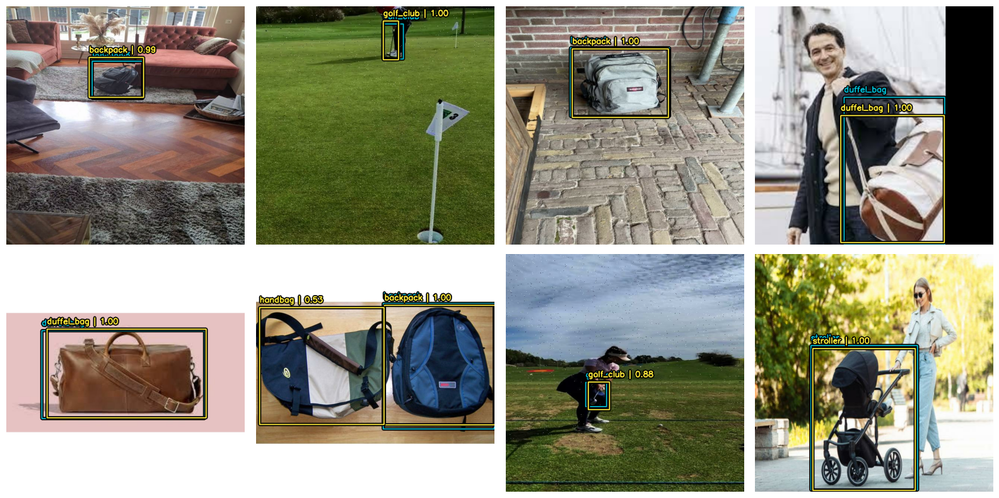

In [62]:
model.prediction_decoder = keras_cv.layers.MultiClassNonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=True,
    iou_threshold=0.5,
    confidence_threshold=0.5,
)

visualize_detections(model, dataset=visualization_ds, bounding_box_format="xywh")

In [26]:
def grab_sample_images(directory_path='/data/sample_images_for_prediction', num_imgs=16, size=(640,640)):
    print('Grabbing images from directory:' + directory_path)
    input_imgs = []
    for filename in os.listdir(directory_path):
        f = os.path.join(directory_path,filename)
        if os.path.isfile(f):
            input_img = image.load_img(f, target_size=(size[0], size[1]))
            #input_img.show()
            
            input_img = image.img_to_array(input_img)
            input_imgs.append(input_img)
        if len(input_imgs) >= num_imgs:
            break
    input_imgs = np.array(input_imgs)
    return input_imgs

def visualize_detections_from_input(model, input_images, bounding_box_format):
    y_pred = model.predict(input_images)
    y_pred = bounding_box.to_ragged(y_pred)
    visualization.plot_bounding_box_gallery(
        input_images,
        value_range=(0, 255),
        bounding_box_format=bounding_box_format,
        y_pred=y_pred,
        scale=4,
        rows=3,
        cols=4,
        show=True,
        font_scale=0.7,
        class_mapping=class_mapping,
    )

Grabbing images from directory:/data/sample_images_for_prediction
1/1 [==============================] - 3s 3s/step


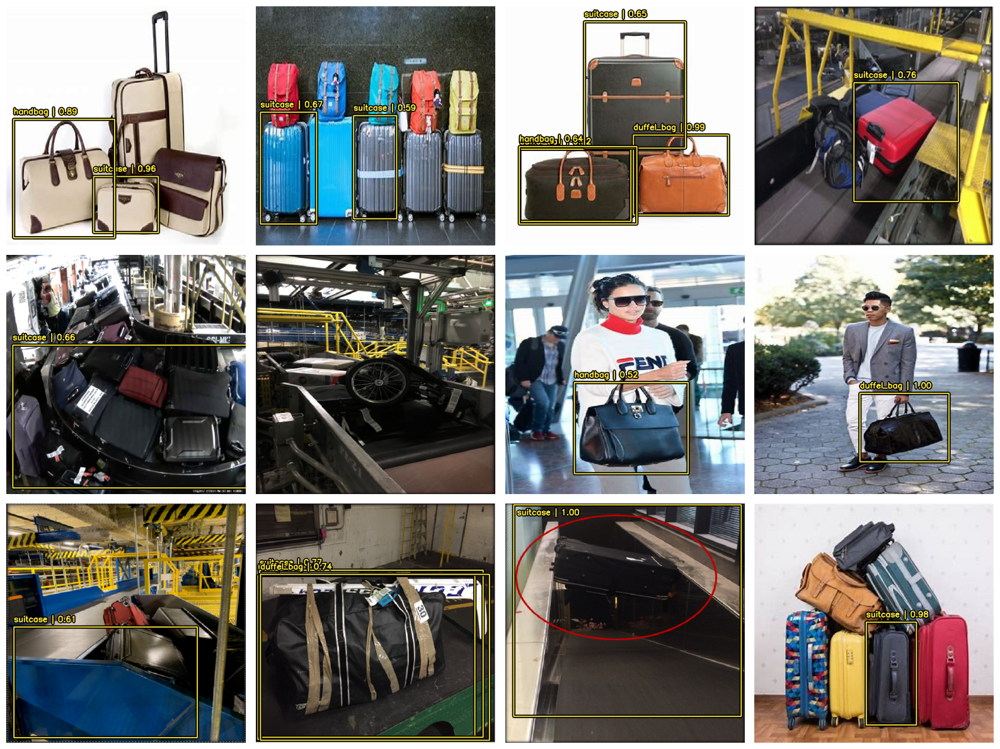

In [40]:
sample_imgs = grab_sample_images()

model.prediction_decoder = keras_cv.layers.MultiClassNonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=True,
    iou_threshold=0,
    confidence_threshold=0.5,
)
visualize_detections_from_input(model, input_images=sample_imgs, bounding_box_format="xywh")

Grabbing images from directory:/data/sample_images_for_prediction
1/1 [==============================] - 3s 3s/step


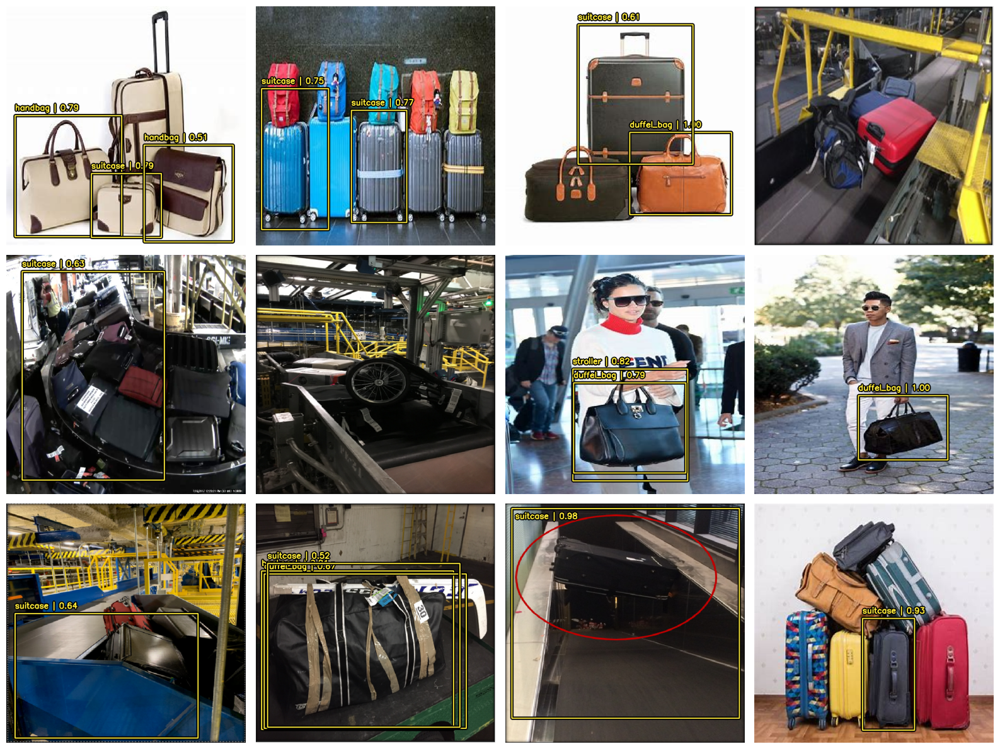

In [63]:
sample_imgs = grab_sample_images()

model.prediction_decoder = keras_cv.layers.MultiClassNonMaxSuppression(
    bounding_box_format="xywh",
    from_logits=True,
    iou_threshold=0,
    confidence_threshold=0.5,
)
visualize_detections_from_input(model, input_images=sample_imgs, bounding_box_format="xywh")